<a href="https://www.kaggle.com/code/eavprog/abscur-abs-ret-distr?scriptVersionId=220121098" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# **Распределения для доходностей абсолютных валютных курсов**

См. страницу на сайте 


# Диапазоны

In [1]:
import pandas as pd

# Получение сегодняшней даты и вычисление дат в прошлом
today = pd.Timestamp.now().normalize()

days_ago_7 = today - pd.Timedelta(days=7)
month_ago = today - pd.DateOffset(months=1)
quarter_ago = today - pd.DateOffset(months=3)
half_year_ago = today - pd.DateOffset(months=6)
year_ago = today - pd.DateOffset(years=1)
two_years_ago = today - pd.DateOffset(years=2)
three_years_ago = today - pd.DateOffset(years=3)
five_years_ago = today - pd.DateOffset(years=5)
ten_years_ago = today - pd.DateOffset(years=10)

# Создание списка диапазонов и их расшифровок
date_ranges = [
    [month_ago, today, "месяц","1m"],
    [quarter_ago, today, "квартал","1q"],
    [half_year_ago, today, "полгода","y2"],
    [year_ago, today, "год","1y"],
    [two_years_ago, today, "два года","2y"],
    [three_years_ago, today, "три года","3y"],
    [five_years_ago, today, "пять лет","5y"],
    [ten_years_ago, today, "десять лет","10y"]
]

ago_dates = {item[2] : item[0] for item in date_ranges}
period_suffix = {item[2] : item[3] for item in date_ranges}

# Загрузка абсолютных валютных курсов

In [2]:
all_abscur = pd.read_csv('/kaggle/input/abscur2/abscur.csv',index_col='Date')
all_abscur.index = pd.to_datetime(all_abscur.index)
all_abscur

,AED,ARS,AUD,BRL,CAD,CHF,CLP,CNY,COP,CZK,...,SAR,SEK,SGD,THB,TRY,TWD,UAH,USD,VND,ZAR
Date,,,,,,,,,,,,,,,,,,,,,
2015-02-01,4.059170,1.731227,11.594916,5.493489,11.755852,16.130559,0.023679,2.379126,0.006199,0.608110,...,3.970527,1.791667,11.033874,0.458044,6.109880,0.472188,0.923378,14.909330,0.000702,1.288351
2015-02-02,4.053116,1.722027,11.610879,5.485297,11.830800,16.052739,0.023643,2.378880,0.006190,0.608047,...,3.964606,1.791264,11.026049,0.457361,6.124461,0.471484,0.922001,14.887096,0.000701,1.295108
2015-02-03,4.030957,1.712137,11.502262,5.479535,11.907159,16.019275,0.023677,2.365274,0.006234,0.611515,...,3.945557,1.799448,11.006285,0.454163,6.164959,0.469858,0.911597,14.805704,0.000697,1.301668
2015-02-04,4.049803,1.720361,11.544752,5.425835,11.829783,16.075287,0.023743,2.379544,0.006217,0.607857,...,3.965061,1.795047,11.042359,0.457127,6.046866,0.472820,0.889197,14.874928,0.000698,1.296505
2015-02-05,4.064686,1.725845,11.651149,5.438633,12.009747,16.200051,0.023945,2.388142,0.006280,0.618295,...,3.978360,1.811133,11.116740,0.458244,6.129210,0.473624,0.613125,14.929591,0.000702,1.323482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-27,6.284408,0.021986,14.478563,3.916690,16.035705,25.551654,0.023420,3.178481,0.005513,0.964746,...,6.152889,2.108106,17.120514,0.683432,0.645539,0.702144,0.550491,23.079488,0.000921,1.231591
2025-01-28,6.291539,0.022001,14.448781,3.940165,16.044060,25.555850,0.023253,3.186855,0.005484,0.961145,...,6.165464,2.103938,17.096944,0.682609,0.647181,0.704053,0.550833,23.106308,0.000922,1.237914
2025-01-29,6.288251,0.021991,14.423761,3.943807,16.033971,25.519573,0.023331,3.187679,0.005546,0.958483,...,6.162908,2.102993,17.113152,0.685141,0.646896,0.703807,0.549652,23.096116,0.000922,1.242291


# График абсолютного курса и доходности

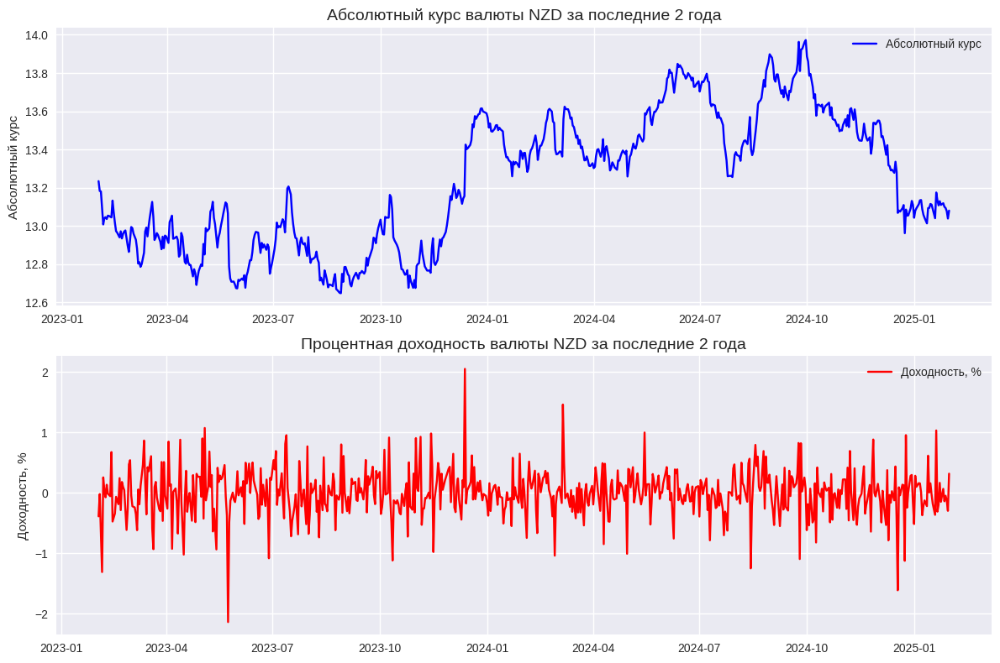

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime, timedelta

# Настройка стиля графиков
plt.style.use('seaborn-v0_8')

# Выбор случайной валюты
random_currency = np.random.choice(all_abscur.columns)

# Фильтрация данных за последние 2 года
end_date = all_abscur.index[-1]  # Последняя дата в данных
start_date = end_date - timedelta(days=2 * 365)  # Дата 2 года назад
filtered_data = all_abscur.loc[start_date:end_date, random_currency]

# Расчёт процентной доходности
returns = filtered_data.pct_change().dropna() * 100  # Процентная доходность

# Создание холста с двумя графиками
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))  # 2 строки, 1 столбец

# График абсолютного курса
ax1.plot(filtered_data.index, filtered_data, color='b', label='Абсолютный курс')
ax1.set_title(f'Абсолютный курс валюты {random_currency} за последние 2 года', fontsize=14)
ax1.set_ylabel('Абсолютный курс')
ax1.grid(True)
ax1.legend()

# График процентной доходности
ax2.plot(returns.index, returns, color='r', label='Доходность, %')
ax2.set_title(f'Процентная доходность валюты {random_currency} за последние 2 года', fontsize=14)
ax2.set_ylabel('Доходность, %')
ax2.grid(True)
ax2.legend()

# Настройка отступов
plt.tight_layout()

# Показать графики
plt.show()

# Диаграммы распределения доходностей абсолютных валютных курсов

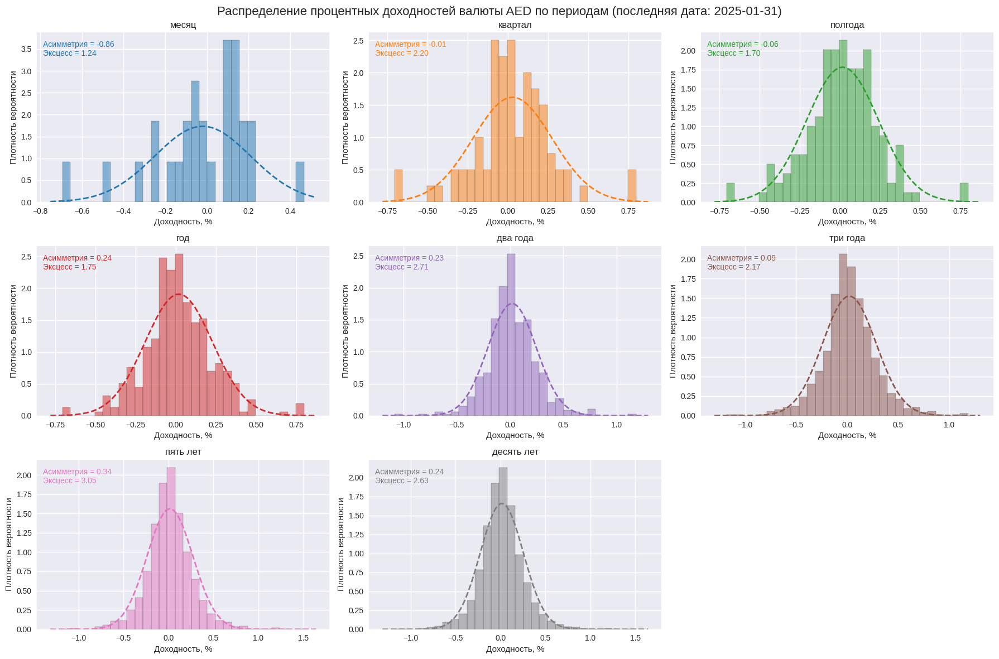

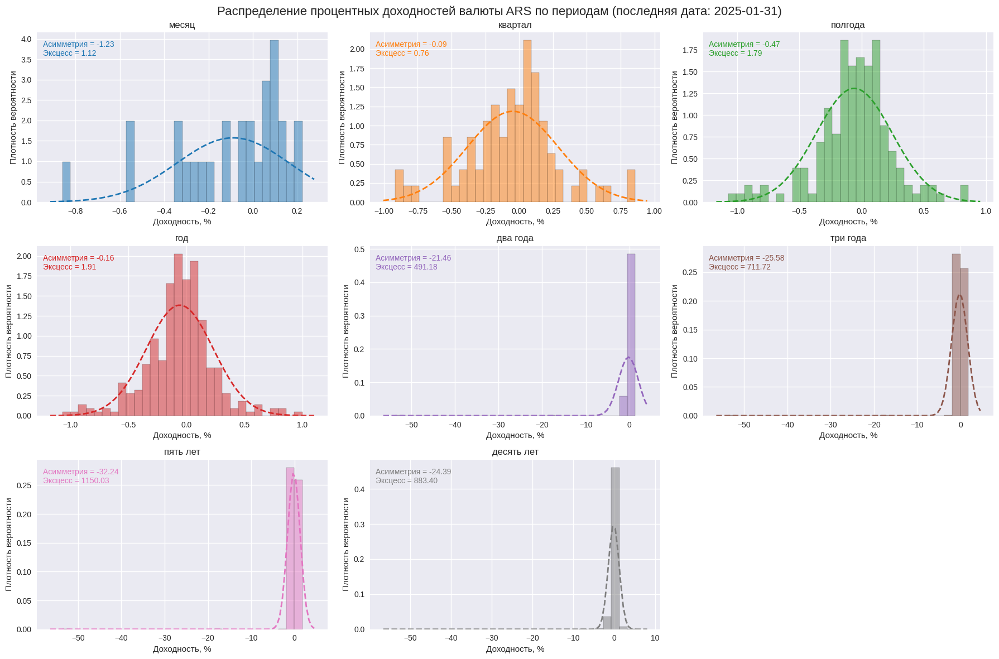

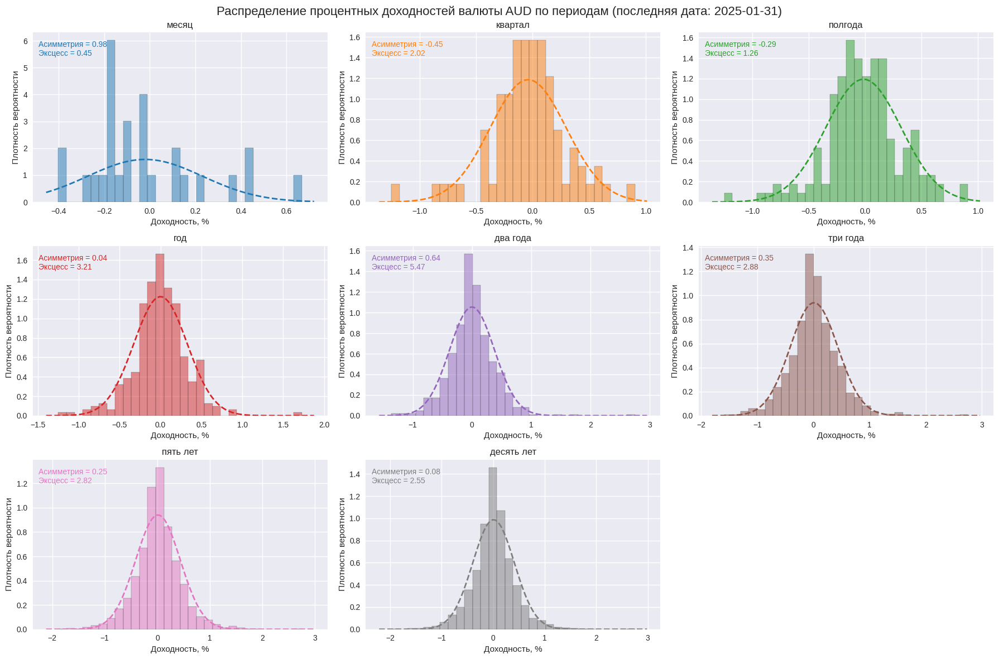

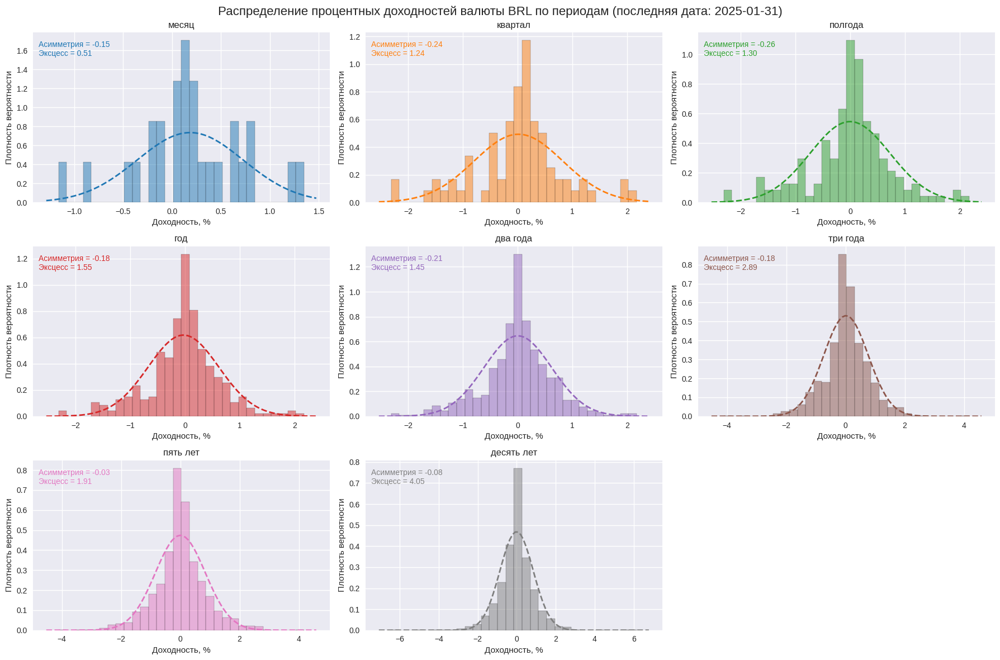

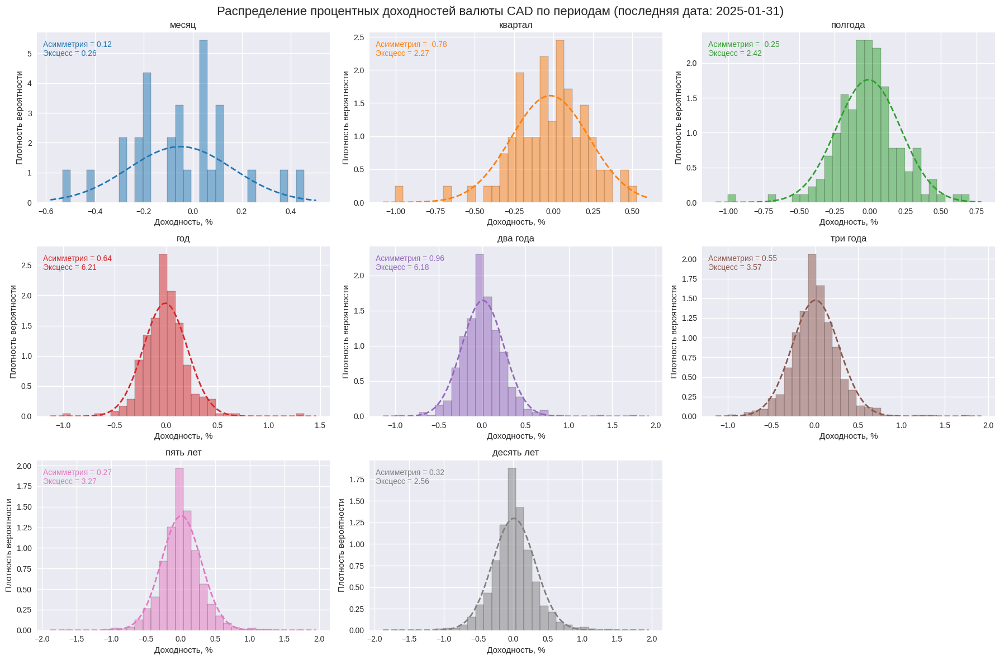

...

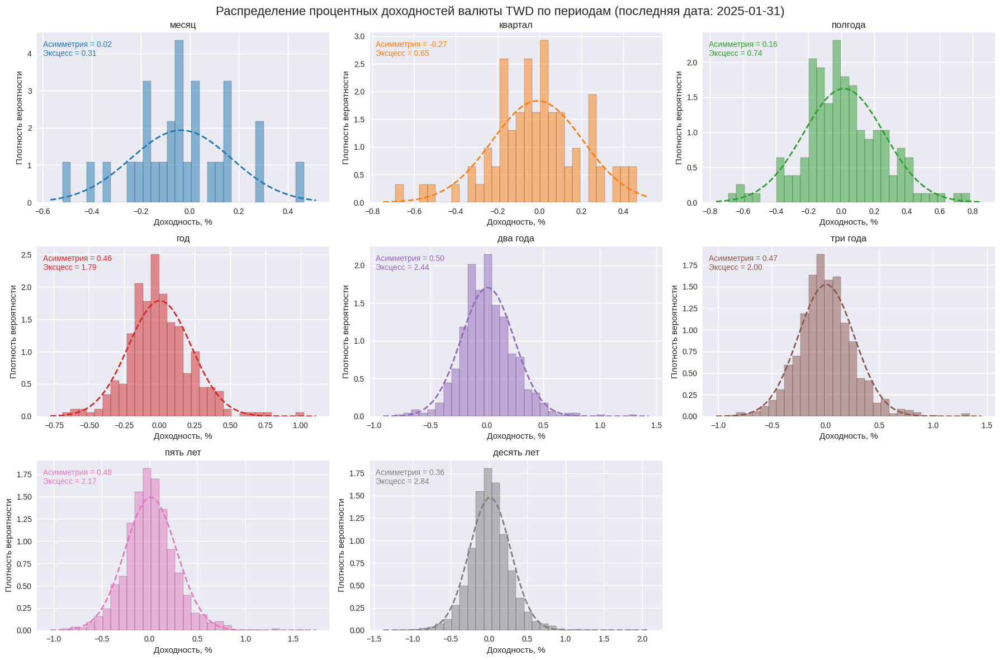

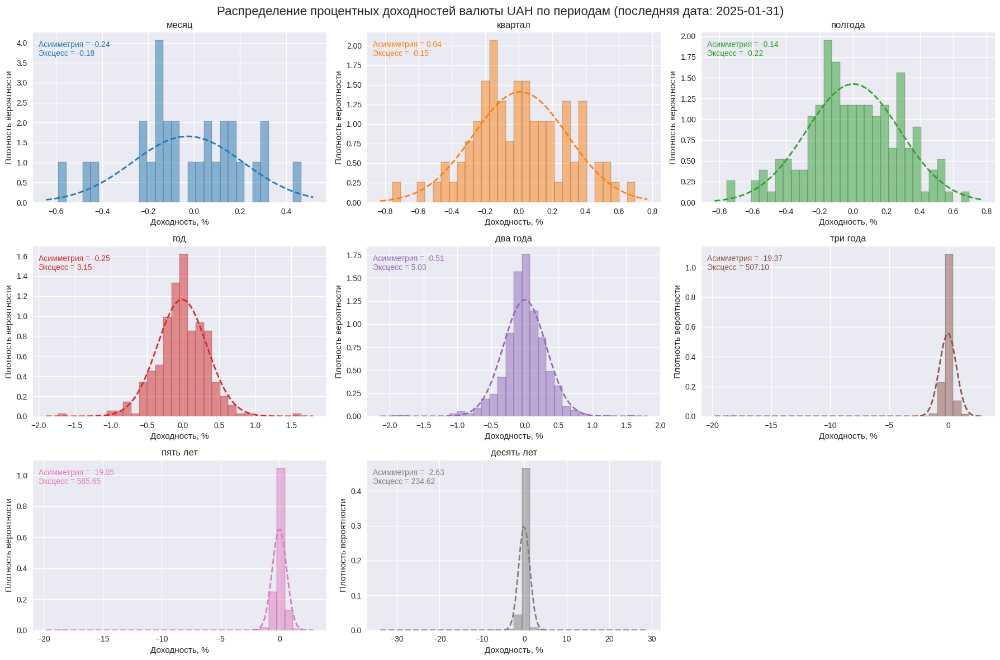

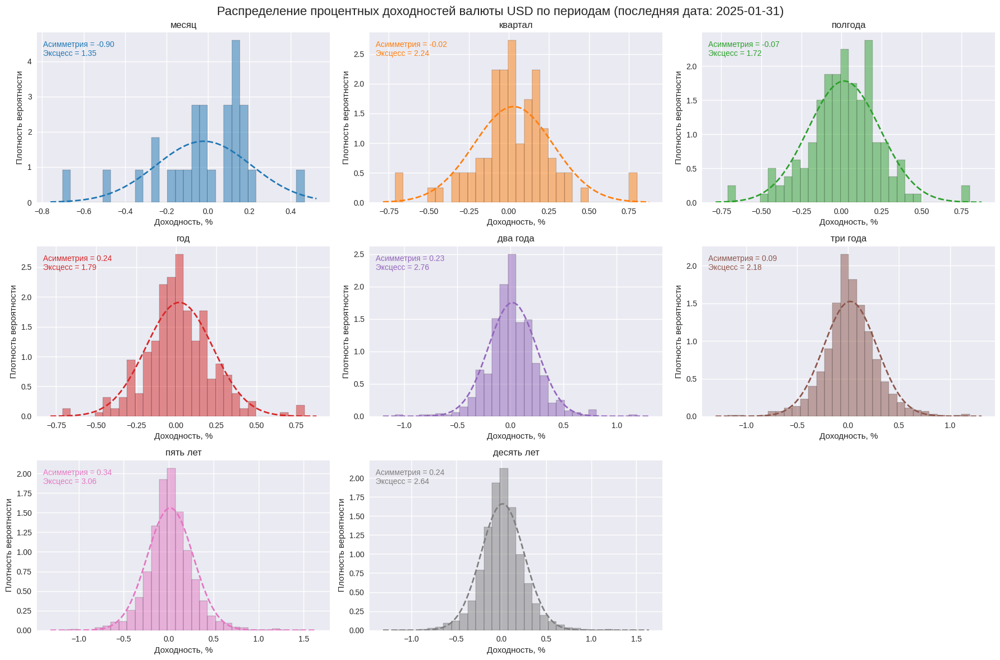

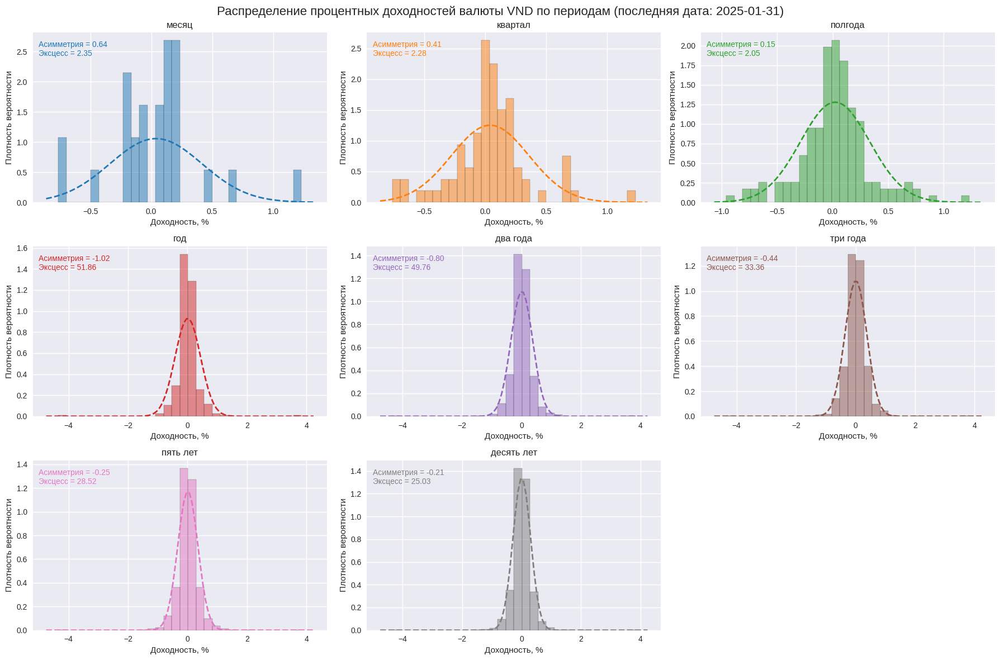

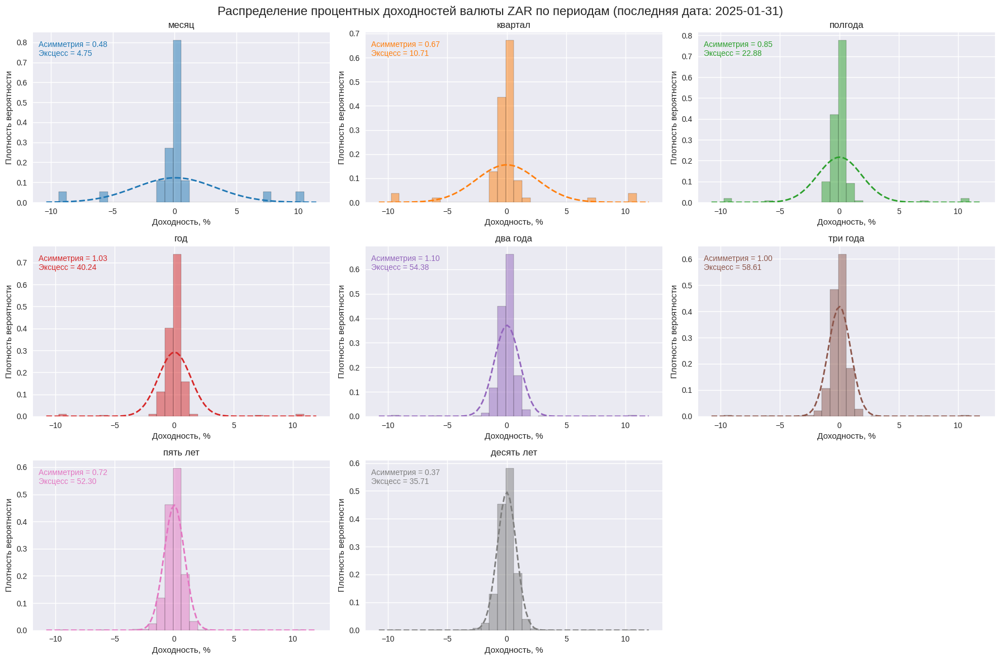

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np
from scipy.stats import norm, skew, kurtosis

# Настройка стиля графиков (используем актуальный стиль Seaborn)
plt.style.use('seaborn-v0_8')

# Получение последней даты из индекса
last_date = all_abscur.index[-1].strftime('%Y-%m-%d')  # Форматируем дату

# Словари для накопления значений асимметрии и эксцесса
skewness_dict = {period: [] for period in ago_dates.keys()}
kurtosis_dict = {period: [] for period in ago_dates.keys()}

# Список валют (тикеров)
currencies = all_abscur.columns

# Переход к процентным доходностям
returns = all_abscur.pct_change().dropna() * 100  # Процентные доходности

# Построение гистограмм для каждой валюты и каждого периода
for column in currencies:
    # Создание сетки 3x3 для графиков
    fig, axes = plt.subplots(3, 3, figsize=(18, 12))  # 3 строки, 3 столбца
    axes = axes.flatten()  # Преобразуем в одномерный массив для удобства
    
    fig.suptitle(f'Распределение процентных доходностей валюты {column} по периодам (последняя дата: {last_date})', fontsize=16)
    colors = plt.cm.tab10.colors  # Палитра цветов для периодов
    
    for i, (period_name, start_date) in enumerate(ago_dates.items()):
        ax = axes[i]  # Выбираем текущую ось
        # Фильтрация данных по периоду
        period_data = returns.loc[returns.index >= start_date, column].dropna()
        
        # Построение гистограммы для текущего периода
        ax.hist(period_data, bins=30, edgecolor='black', alpha=0.5, density=True, 
                color=colors[i], label=period_name)
        
        # Вычисление параметров нормального распределения
        mu, std = norm.fit(period_data)
        
        # Генерация точек для кривой нормального распределения
        xmin, xmax = ax.get_xlim()
        x = np.linspace(xmin, xmax, 100)
        p = norm.pdf(x, mu, std)
        
        # Построение кривой нормального распределения (пунктирная линия)
        ax.plot(x, p, '--', linewidth=2, color=colors[i], label=f'{period_name} (норм. распр.)')
        
        # Вычисление коэффициентов асимметрии и эксцесса
        skewness = skew(period_data)
        kurt = kurtosis(period_data)
        
        # Накопление значений в словарях
        skewness_dict[period_name].append(skewness)
        kurtosis_dict[period_name].append(kurt)
        
        # Добавление текста с коэффициентами на график
        ax.text(0.02, 0.95,
                f'Асимметрия = {skewness:.2f}\nЭксцесс = {kurt:.2f}', 
                transform=ax.transAxes, color=colors[i], fontsize=10, verticalalignment='top')
        
        # Настройка текущего графика
        ax.set_title(period_name)  # Заголовок для текущего периода
        ax.set_xlabel('Доходность, %')  # Ось X
        ax.set_ylabel('Плотность вероятности')  # Ось Y
        ax.grid(True)  # Сетка
    
    # Скрываем последнюю (девятую) ячейку, если она не используется
    if len(ago_dates) < 9:
        for j in range(len(ago_dates), 9):
            axes[j].axis('off')  # Скрываем пустые ячейки
    
    plt.tight_layout()  # Автоматическая настройка отступов
    plt.show()  # Показать график

    

# Ретинги близости к нормальному распределению

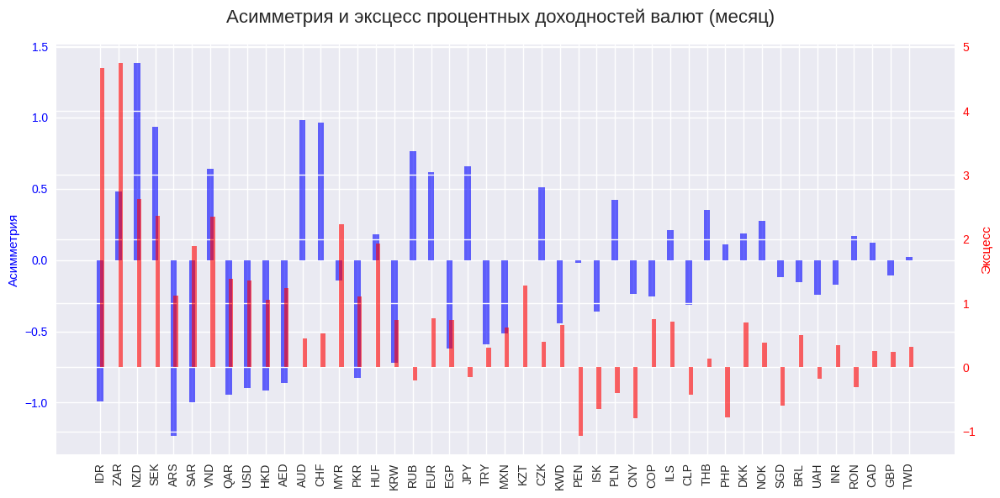

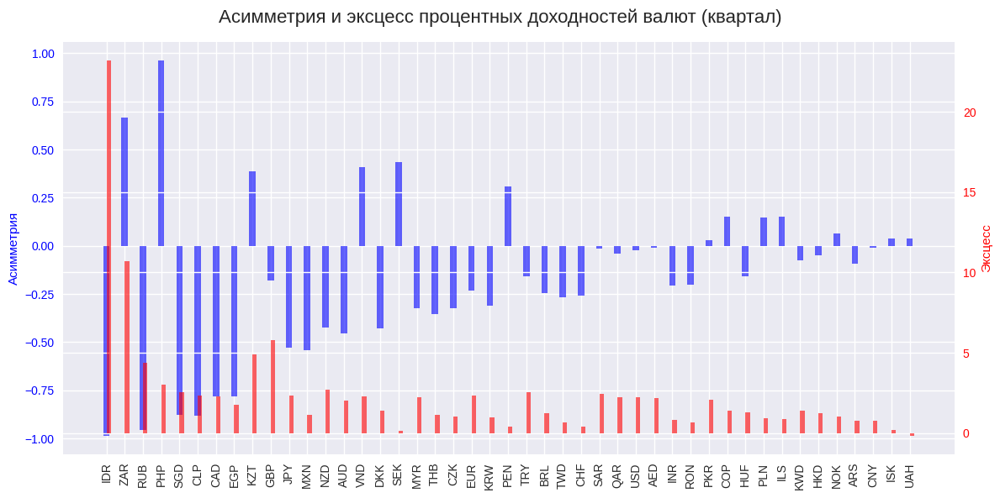

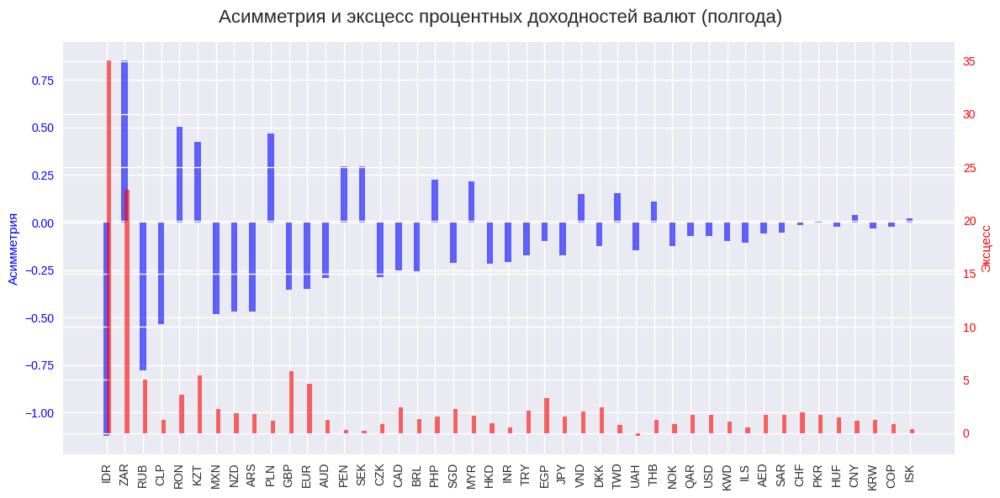

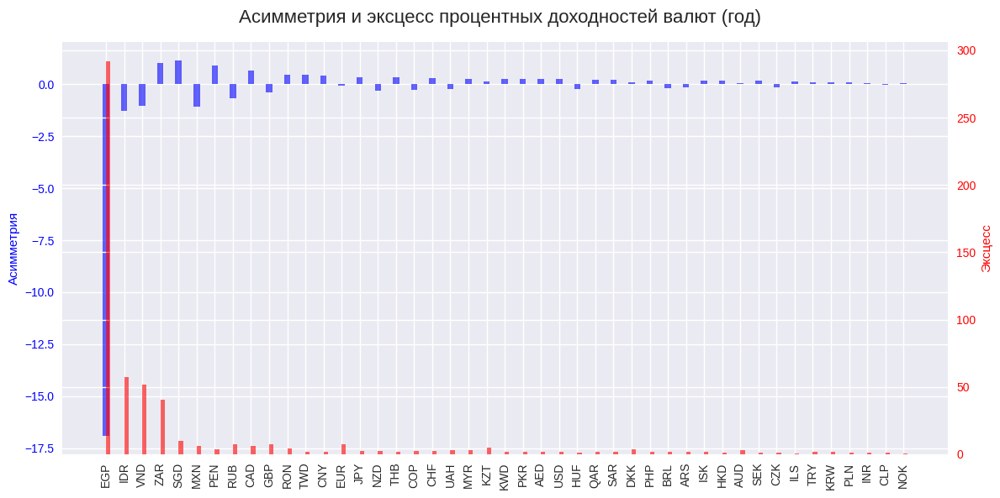

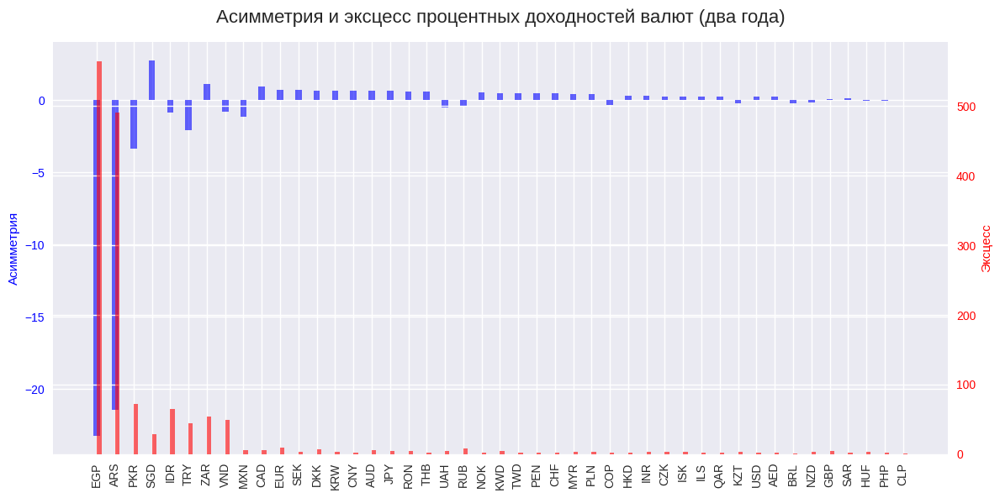

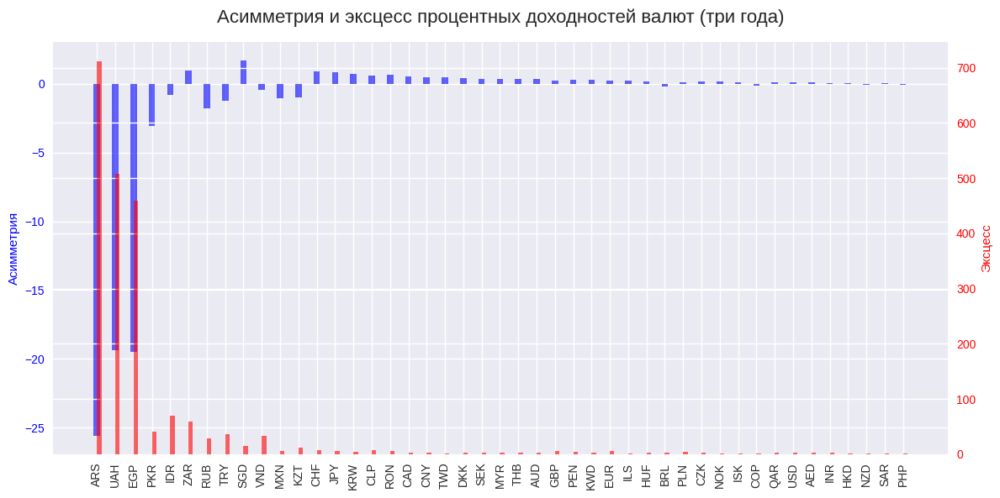

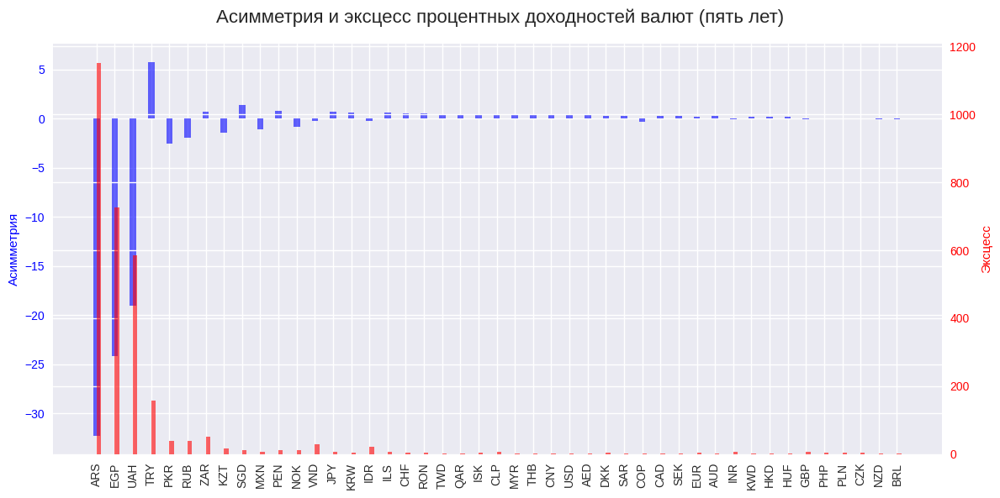

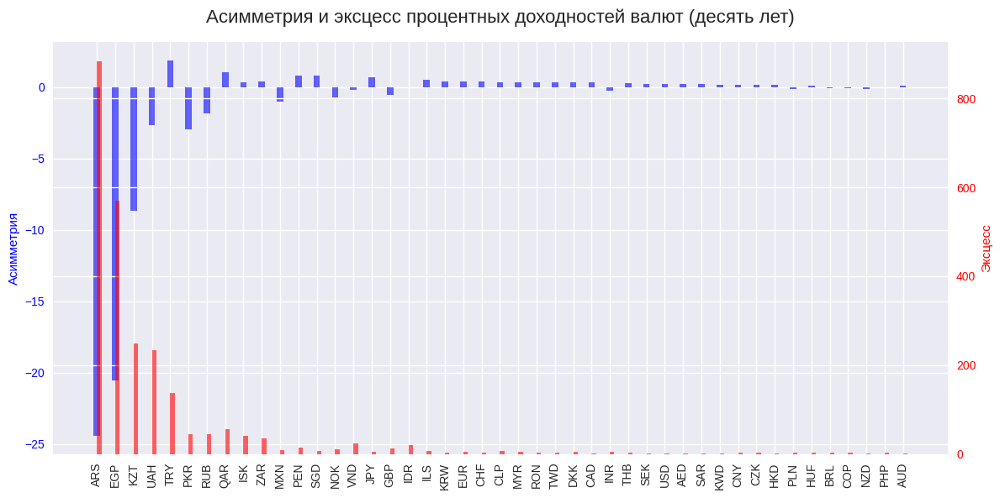

In [5]:
# Построение столбчатых диаграмм для каждого временного периода
for period_name in ago_dates.keys():
    skewness_values = skewness_dict[period_name]
    kurtosis_values = kurtosis_dict[period_name]
    
    # Создание DataFrame для сортировки значений по убыванию суммы квадратов
    results_df = pd.DataFrame({
        'Currency': currencies,  # Используем список валют
        'Skewness': skewness_values,
        'Kurtosis': kurtosis_values,
    })
    
    # Нормированная сумма квадратов асимметрии и эксцесса
    results_df['Sum_Squares'] = (results_df['Skewness']**2 / (results_df['Skewness']**2).sum() + 
                                 results_df['Kurtosis']**2 / (results_df['Kurtosis']**2).sum())
    results_df.sort_values(by='Sum_Squares', ascending=False, inplace=True)

    # Построение столбчатой диаграммы с двумя вертикальными осями
    fig2, ax1 = plt.subplots(figsize=(12, 6))

    width = 0.35  # Ширина столбцов

    # Столбцы для асимметрии (левая ось)
    ax1.bar(results_df['Currency'], results_df['Skewness'], width=width, color='b', alpha=0.6, label='Асимметрия', align='center')
    ax1.set_ylabel('Асимметрия', color='b')
    ax1.tick_params(axis='y', labelcolor='b')
    
    # Установка меток на оси X
    ax1.set_xticks(range(len(results_df['Currency'])))  # Устанавливаем позиции меток
    ax1.set_xticklabels(results_df['Currency'], rotation=90)  # Устанавливаем подписи меток

    # Создание второй оси для эксцесса (правая ось)
    ax2 = ax1.twinx()
    ax2.bar(results_df['Currency'], results_df['Kurtosis'], width=width * 0.7, color='r', alpha=0.6, label='Эксцесс', align='edge')
    ax2.set_ylabel('Эксцесс', color='r')
    ax2.tick_params(axis='y', labelcolor='r')

    # Заголовок графика
    fig2.suptitle(f'Асимметрия и эксцесс процентных доходностей валют ({period_name})', fontsize=16)

    fig2.tight_layout()  # Автоматическая настройка отступов

    plt.show()  # Показать график с асимметрией и эксцессом для текущего периода

# Генерация MD кода

In [6]:
# import pandas as pd

# # Генерация MD-кода для таблицы std_devs
# md_table = volatilities.to_markdown(index=True)

# print(md_table)

# Генерация HTML-кода

In [7]:
# import pandas as pd

# # Генерация HTML-кода для таблицы std_devs
# html_table = volatilities.to_html(index=True, border=1, justify='right', escape=False)

# # Добавление CSS для выравнивания и предотвращения переноса значений в ячейках
# html_table = html_table.replace('<table', '<table style="table-layout: fixed; word-wrap: nowrap;"')

# html_table = html_table.replace('\n', '')

# # Выводим HTML-код
# print(html_table)